In [1]:
import rioxarray as rxr 
import matplotlib.pyplot as plt 
import geopandas as gpd
import numpy as np

import strain_tools as st 

In [2]:

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [33]:
def _deviatoric_nondimensional(strain_rate, effective_strain_rate, temperature, n: float):
    """
    Calculate deviatoric stress using nondimensional method from Greve (2025).
    
    Assumes temperature is in Kelvin and strain rates are in a^-1.
    """
        
    # Calculate flow rate parameter A following Cuffey and Paterson (2010)
    R = 8.314  # J K^-1 mol^-1, Ideal gas constant
    Tstar = 263.15  # K, Transition temperature
    Aprefactor = 3.5e-25  # s^-1 Pa^-1, Constant A prefactor (value at -10°C)
        
    # Use vectorized conditional logic for activation energy
    Q_c = np.where(temperature <= Tstar, 60e3, 115e3)  # J mol^-1
    
    # Calculate flow rate parameter A
    A = Aprefactor * np.exp(-(Q_c / R) * (1 / temperature - 1 / Tstar))

    # Convert from s^-1 Pa^-n to a^-1 Pa^-1
    A = A * 3.15576e7 # Seconds in 365.25 days

    # Calculate A* = A^(-1/n)
    Astar = A ** (-1 / n)

    print((f"A: {A:.2e}"))
    print((f"A*: {Astar:.2e}"))

    # # Nondimensional scales following Greve (2025)
    # stress_scale = 1e5  # Pa, typical deviatoric stress
    # strain_scale = 2.5e-2  # a^-1, typical strain rate
    # Astar_scale = stress_scale / (strain_scale ** (1 / n)) 
        
    # # Calculate dimensionless A*
    # astar_dimless = Astar / Astar_scale
    
    # # Calculate deviatoric stress using nondimensional flow law
    # # tau_ij = [A*] * A*_dimless * d_e^(-(1-1/n)) * d_ij
    # tau = Astar_scale * astar_dimless * effective_strain_rate ** (-(1 - 1 / n)) * strain_rate
    
    # Alternative solution, as [A*] * Ã* = A* anyway
    tau = Astar * effective_strain_rate ** (-(1 - 1 / n)) * strain_rate

    print((f"Stress: {tau:.2e}"))
    # return tau

strain_rate = 0.5
effective_strain_rate = 0.2
temperature = 263.15

_deviatoric_nondimensional(strain_rate, effective_strain_rate, temperature, n=3)

_deviatoric_nondimensional(strain_rate, effective_strain_rate, temperature, n=4)

A: 1.10e-17
A*: 4.49e+05
Stress: 6.56e+05
A: 1.10e-17
A*: 1.73e+04
Stress: 2.90e+04


In [30]:
1.10e-17**(-1/4)

17364.08202519683

In [3]:

vv = rxr.open_rasterio('../data/vv_store.tif').squeeze()
vx = rxr.open_rasterio('../data/vx_store.tif').squeeze()
vy = rxr.open_rasterio('../data/vy_store.tif').squeeze()
mask = rxr.open_rasterio('../data/mask_store.tif').squeeze()

# vv = vv.where(mask==1, np.nan)
vx = vx.where(mask==1, np.nan)
vy = vy.where(mask==1, np.nan)

# Calculate absolute velocity
vv = np.sqrt(vx**2 + vy**2)


In [4]:
resolution = vv.rio.resolution()[0] # 120 metres
length_scale = 500 # metres

strain = st.strain.logarithmic(vx, vy, pixel_size=resolution, length_scale=length_scale, unit_time='a')

In [5]:
principal = st.strain.principal(strain.e_xx, strain.e_yy, strain.e_xy)

In [6]:
effective = st.strain.effective(strain.e_xx, strain.e_yy, strain.e_xy)

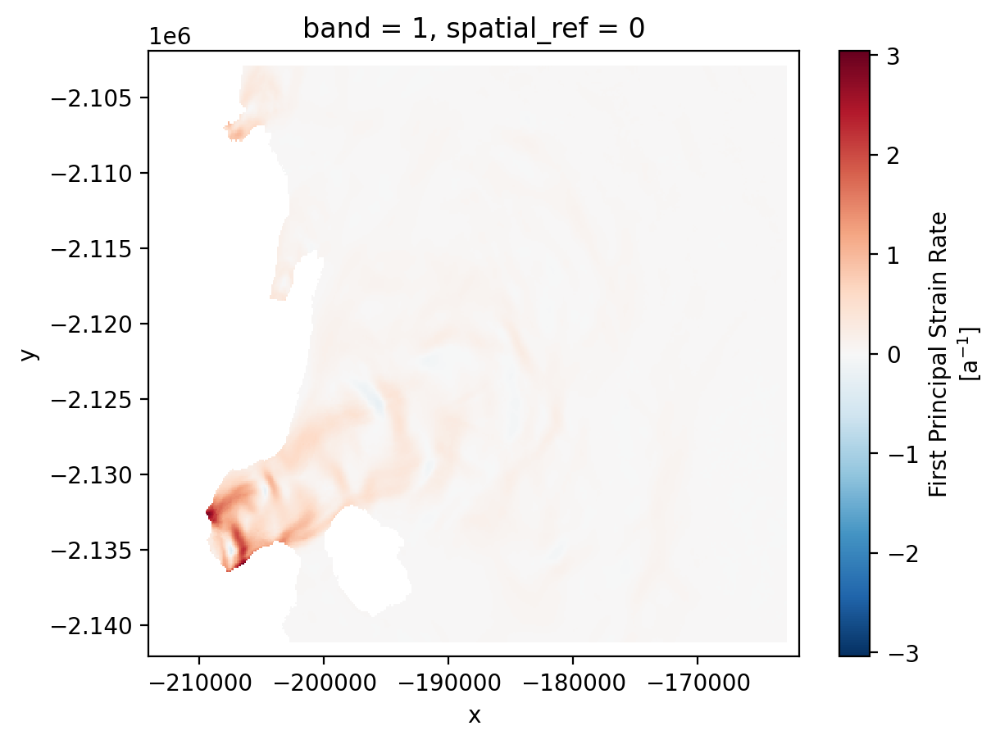

In [20]:
plt.close()
principal.e_1.plot()

In [7]:
# Test the internal calculation
from strain_tools.stress import _deviatoric_nondimensional, _deviatoric_dimensional

# Use same inputs as your test
strain_rate_test = principal.e_1.isel(x=100, y=100).values
effective_test = effective.isel(x=100, y=100).values
temp_test = -15 + 273.15

# Dimensional result
tau_dim = _deviatoric_dimensional(strain_rate_test, effective_test, temp_test, n=3)
print(f"Dimensional result: {tau_dim} Pa = {tau_dim/1e3} kPa")

# Nondimensional result  
tau_nondim = _deviatoric_nondimensional(strain_rate_test, effective_test, temp_test, n=3)
print(f"Nondimensional result: {tau_nondim} Pa = {tau_nondim/1e3} kPa")

# Ratio
print(f"Ratio (nondim/dim): {tau_nondim / tau_dim:.2e}")

Dimensional result: 117249.17264426083 Pa = 117.24917264426084 kPa
Nondimensional result: 160165.5668014683 Pa = 160.1655668014683 kPa
Ratio (nondim/dim): 1.37e+00


In [18]:
strain_rate = 0.1
effective_strain_rate = 0.1
temperature = 263.15  # K

print(
    st.stress._deviatoric_nondimensional(
        strain_rate=strain_rate,
        effective_strain_rate=effective_strain_rate,
        temperature=temperature,
        n=3
    )
)

print(
    st.stress._deviatoric_nondimensional(
        strain_rate=strain_rate,
        effective_strain_rate=effective_strain_rate,
        temperature=temperature,
        n=4
    )
)

208421.56991563432
9754.544563607004


In [45]:
# Parameters
t_low = -15 # ˚C
t_high = -5 # ˚C
n_low = 3
n_high = 4

# ˚C > K
t_low += 273.15  # convert to K
t_high += 273.15  # convert to K

# method = 'dimensional'
method = 'nondimensional'

# principal stresses
t_1_t_low_n_low = st.stress.deviatoric(
    principal.e_1, effective, 
    temperature=t_low, 
    n=n_low, 
    unit_output='kPa', 
    long_name='First Principal Deviatoric Stress',
    method=method,
    )

t_1_t_low_n_high = st.stress.deviatoric(
    principal.e_1, effective, 
    temperature=t_low, 
    n=n_high, 
    unit_output='kPa', 
    long_name='First Principal Deviatoric Stress',
    method=method,
    )

t_1_t_high_n_low = st.stress.deviatoric(
    principal.e_1, effective, 
    temperature=t_high, 
    n=n_low, 
    unit_output='kPa', 
    long_name='First Principal Deviatoric Stress',
    method=method,
    )

t_1_t_high_n_high = st.stress.deviatoric(
    principal.e_1, effective, 
    temperature=t_high, 
    n=n_high, 
    unit_output='kPa', 
    long_name='First Principal Deviatoric Stress',
    method=method,
    )



Text(0.5, 1.0, 'T=-5.0˚C, n=4')

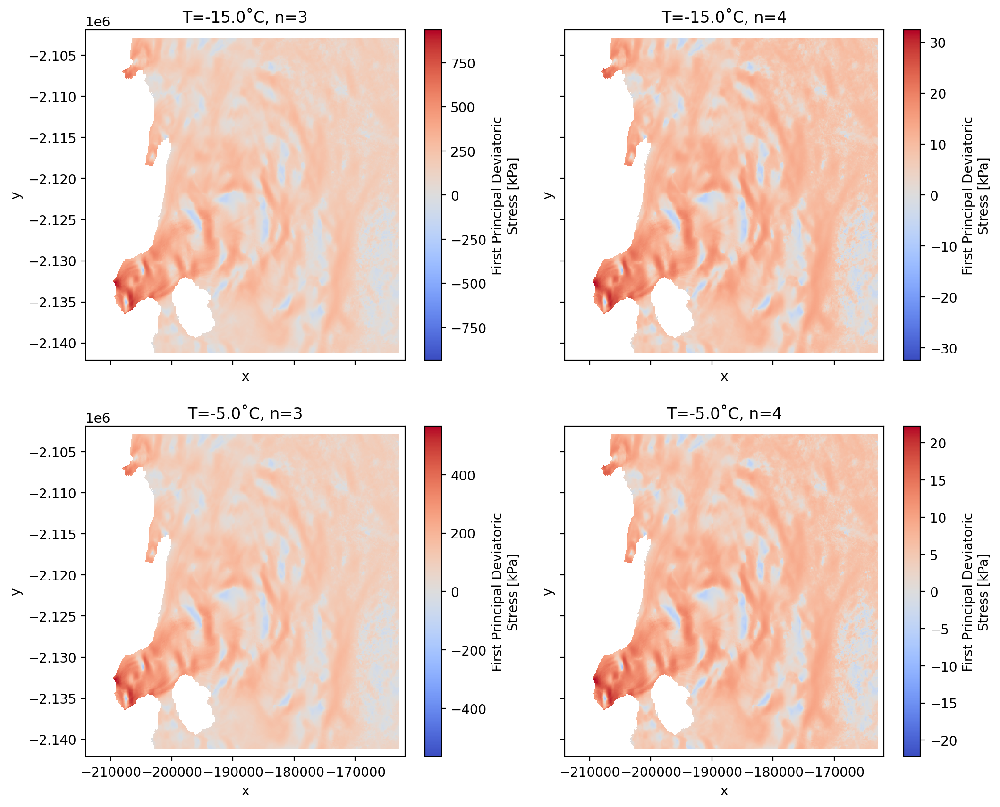

In [46]:

plt.close()
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12, 10), sharex=True, sharey=True)

vrange=700

t_1_t_low_n_low.plot(
    ax=ax[0,0], cmap='coolwarm', 
    # vmin=-vrange, vmax=vrange
)
ax[0,0].set_title(f'T={t_low - 273.15}˚C, n={n_low}')

t_1_t_low_n_high.plot(
    ax=ax[0,1], cmap='coolwarm', 
    # vmin=-vrange, vmax=vrange
)
ax[0,1].set_title(f'T={t_low - 273.15}˚C, n={n_high}')

t_1_t_high_n_low.plot(
    ax=ax[1,0], cmap='coolwarm', 
    # vmin=-vrange, vmax=vrange
)
ax[1,0].set_title(f'T={t_high - 273.15}˚C, n={n_low}')

t_1_t_high_n_high.plot(
    ax=ax[1,1], cmap='coolwarm', 
    # vmin=-vrange, vmax=vrange
)
ax[1,1].set_title(f'T={t_high - 273.15}˚C, n={n_high}')


IndexError: index 10 is out of bounds for axis 0 with size 10

IndexError: index 10 is out of bounds for axis 0 with size 10

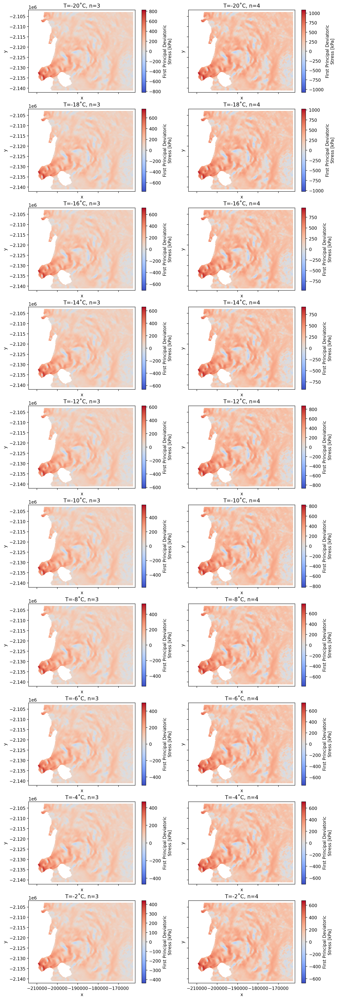

In [43]:
# Construct similar plots with two columns and ten rows. In the first column, n=3, and in the second, n=4. Each row should correspond to a different temperature, ranging from -20˚C to 0˚C in 2˚C increments.


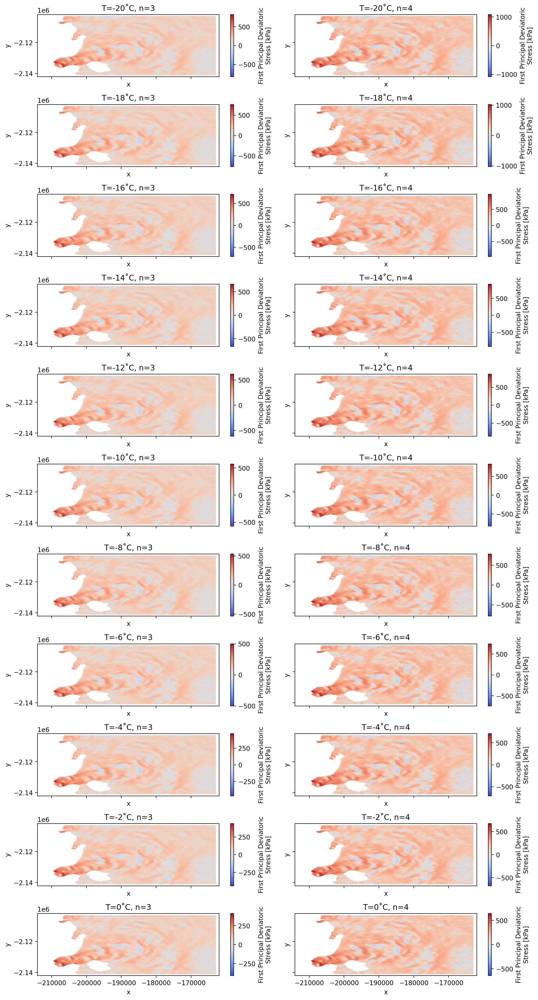

In [44]:
plt.close()
fig, ax = plt.subplots(nrows=11, ncols=2, figsize=(12, 22), sharex=True, sharey=True)

temps_celsius = np.arange(-20, 2, 2)
temps_kelvin = temps_celsius + 273.15

for i, (t_celsius, t_kelvin) in enumerate(zip(temps_celsius, temps_kelvin)):
    # Calculate stress for n=3
    stress_n3 = st.stress.deviatoric(
        principal.e_1, effective,
        temperature=t_kelvin,
        n=3,
        unit_output='kPa',
        long_name='First Principal Deviatoric Stress',
        method='dimensional',
    )
    
    # Calculate stress for n=4
    stress_n4 = st.stress.deviatoric(
        principal.e_1, effective,
        temperature=t_kelvin,
        n=4,
        unit_output='kPa',
        long_name='First Principal Deviatoric Stress',
        method='dimensional',
    )
    
    # Plot n=3 in first column
    stress_n3.plot(ax=ax[i, 0], cmap='coolwarm')
    ax[i, 0].set_title(f'T={t_celsius}˚C, n=3')
    
    # Plot n=4 in second column
    stress_n4.plot(ax=ax[i, 1], cmap='coolwarm')
    ax[i, 1].set_title(f'T={t_celsius}˚C, n=4')

plt.tight_layout()